In [12]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
!pip install numpy torch wandb swig gymnasium[box2d] matplotlib termcolor

zsh:1: no matches found: gymnasium[box2d]


In [20]:
import test1
from utils import *

# Reinforcement Learning Part 1: DQN
By Lawrence Liu and Tonmoy Monsoor
## Some General Instructions

- As before, please keep the names of the layer consistent with what is requested in model.py. Otherwise the test functions will not work

- You will need to fill in the model.py, the DQN.py file, the buffer.py file, and the
env_wrapper.py

DO NOT use Windows for this project, gymnasium does is not supported for windows and installing it will be a pain.

### Introduction to the Enviroment
We will be training a DQN agent to play the game of CarRacing. The agent will be trained to play the game using the pixels of the game as an input. The reward structure is as follows for each frame:
- -0.1 for each frame
- +1000/N where N is the number of tiles visited by the car in the episode

The overall goal of this game is to design a agent that is able to play the game with a average test score of above 600. In discrete mode the actions can take 5 actions,
- 0: Do Nothing
- 1: Turn Left
- 2: Turn Right
- 3: Accelerate
- 4: Brake

First let us visualize the game and understand the environment.

In [16]:
import gymnasium as gym
import numpy as np
env = gym.make('CarRacing-v2', continuous=False, render_mode='rgb_array')
env.np_random = np.random.RandomState(42)

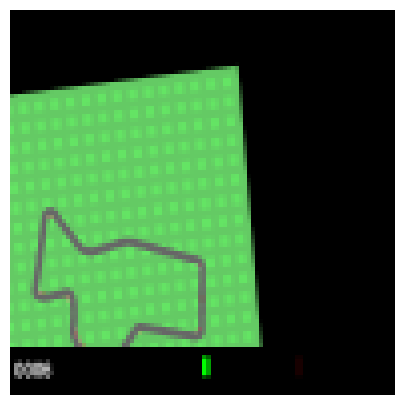

In [21]:

from IPython.display import HTML

frames = []
s, _ = env.reset()

while True:
    a = env.action_space.sample()
    s, r, terminated, truncated, _ = env.step(a)
    frames.append(s)
    if terminated or truncated:
        break


anim = animate(frames)
HTML(anim.to_jshtml())

So a couple things we can note:
- at the beginning of the game, we have 50 frames of the game slowly zooming into the car, we should ignore this period, ie no-op during this period.
- there is a black bar at the bottom of the screen, we should crop this out of the observation. 

In addition, another thing to note is that the current frame doesn't give much information about the velocity and acceleration of the car, and that the car does not move much for each frame.
### Environment Wrapper (5 points)
As a result, you will need to complete `EnvWrapper` in `env_wrapper.py`. You can find more information in the docstring for the wrapper, however the main idea is that it is a wrapper to the environment that does the following:
- skips the first 50 frames of the game
- crops out the black bar and reshapes the observation to a 84x84 image, as well as turning the resulting image to grayscale
- performs the actions for `skip_frames` frames
- stacks the last `num_frames` frames together to give the agent some information about the velocity and acceleration of the car.


In [57]:
from env_wrapper import EnvWrapper
test1.test_wrapper(EnvWrapper)

Passed reset
Passed step


### CNN Model (5 points)
Now we are ready to build the model. Our architecture of the CNN model is the one proposed by Mnih et al in "Human-level control through deep reinforcement learning". Specifically this consists of the following layers:
- A convolutional layer with 32 filters of size 8x8 with stride 4 and relu activation
- A convolutional layer with 64 filters of size 4x4 with stride 2 and relu activation
- A convolutional layer with 64 filters of size 3x3 with stride 1 and relu activation
- A fully connected layer with 512 units and relu activation
- A fully connected layer with the number of outputs of the environment

Please implement this model `Nature_Paper_Conv` in `model.py` as well as the helper 
`MLP` class.

In [62]:
import model
test1.test_model_DQN(model.Nature_Paper_Conv)

Passed


### DQN (40 points)
Now we are ready to implement the DQN algorithm. 

![title](DQN.png)

#### Replay Buffer (5 points)
First start by implementing the DQN replay buffer `ReplayBufferDQN` in `buffer.py`. This buffer will store the transitions of the agent and sample them for training. 

In [74]:
from replay_buffer import ReplayBufferDQN

test1.test_DQN_replay_buffer(ReplayBufferDQN)

Passed



#### DQN (15 points)
Now implement the `_optimize_model` and `sample_action` functions in `DQN` in `DQN.py`. The `_optimize_model` function will sample a batch of transitions from the replay buffer and update the model. The `sample_action` function will sample an action from the model given the current state. Train the model over 200 episdoes, validating every 50 episodes for 30 episodes, before testing the model for 50 episodes at the end.

In [75]:
import DQN
import utils
import torch 


trainerDQN = DQN.DQN(EnvWrapper(env),
                model.Nature_Paper_Conv,
                lr = 0.00025,
                gamma = 0.95,
                buffer_size=100000,
                batch_size=32,
                loss_fn = "mse_loss",
                use_wandb = False,
                device = 'cpu',
                seed = 42,
                epsilon_scheduler = utils.exponential_decay(1, 700,0.1),
                save_path = utils.get_save_path("DQN","./runs/"))

trainerDQN.train(200,50,30,50,50)
                
                

saving to ./runs/DQN/run5
Episode: 1: Time: 33.64623475074768 Total Reward: -46.45631067961198 Avg_Loss: 0.621379971195748
Episode: 2: Time: 49.94780421257019 Total Reward: -49.22535211267659 Avg_Loss: 0.7479008084491772
Episode: 3: Time: 50.54845309257507 Total Reward: -37.56756756756773 Avg_Loss: 0.834273373254207
Episode: 4: Time: 49.68352818489075 Total Reward: -73.72340425531954 Avg_Loss: 0.6650738081886989
Episode: 5: Time: 50.79087996482849 Total Reward: -66.32616487455289 Avg_Loss: 0.6004117653869531
Episode: 6: Time: 51.46130609512329 Total Reward: -53.33333333333401 Avg_Loss: 0.5451677008023282
Episode: 7: Time: 53.26769781112671 Total Reward: -10.750915750916104 Avg_Loss: 0.598176203652465
Episode: 8: Time: 52.90106701850891 Total Reward: -28.566433566433965 Avg_Loss: 0.6221847685539171
Episode: 9: Time: 52.767723083496094 Total Reward: -18.0769230769237 Avg_Loss: 0.8168262183008825
Episode: 10: Time: 53.60030007362366 Total Reward: 86.81818181818642 Avg_Loss: 1.047996789373

Please include a plot of the training and validation rewards over the episodes in the report. An additional question to answer is does the loss matter in DQN? Why or why not?

In Deep Q-Networks (DQN), the loss function is crucial as it measures the discrepancy between predicted Q-values and target Q-values, guiding the neural network's weight updates. Minimizing the loss ensures the model's Q-value predictions align closely with expected rewards, promoting stability and convergence. A stable loss indicates that the model is learning effectively and avoiding issues like overestimation, which can lead to suboptimal policies. However, while the loss is important for training, the ultimate goal of DQN is to maximize cumulative rewards. Therefore, a low loss does not always directly translate to high performance, as the model must also navigate exploration-exploitation trade-offs and the environment's stochastic nature.

We can also draw a animation of the car in one game, the code is provided below

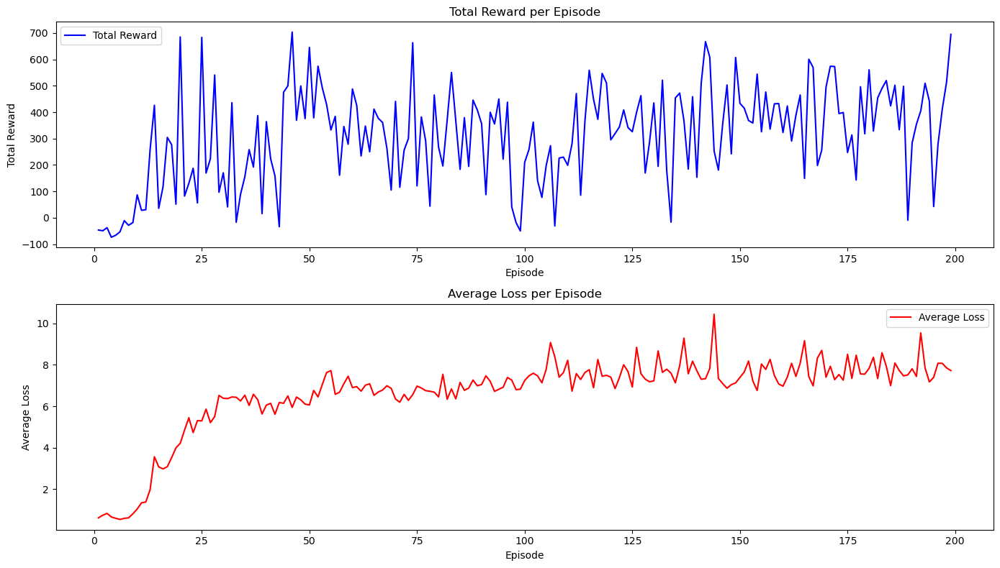

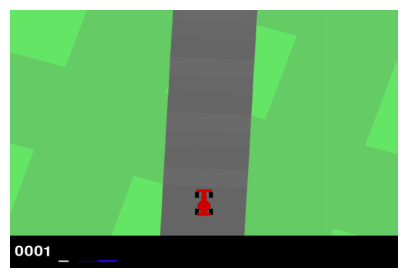

In [78]:
#plotting the training rewards and the validation rewards
import matplotlib.pyplot as plt

def plot_metrics():
    episodes = list(range(1, 200))  # Assuming you want to plot for 199 episodes
    
    times = [
        33.64623475074768, 49.94780421257019, 50.54845309257507, 49.68352818489075, 50.79087996482849,
        51.46130609512329, 53.26769781112671, 52.90106701850891, 52.767723083496094, 53.60030007362366,
        50.190484046936035, 50.82638621330261, 51.64816498756409, 54.55801177024841, 51.78815817832947,
        52.11056184768677, 53.69854784011841, 52.72233438491821, 52.645715951919556, 54.29171419143677,
        54.68485379219055, 52.806293964385986, 53.46469521522522, 58.42589282989502, 53.06667995452881,
        53.0435791015625, 52.147809743881226, 53.11340308189392, 56.79640316963196, 54.681421995162964,
        53.700287103652954, 56.46209001541138, 53.82415795326233, 54.0392529964447, 54.00353169441223,
        55.09529519081116, 53.61705994606018, 55.72029709815979, 57.086889028549194, 55.74293613433838,
        55.525856733322144, 61.85062289237976, 60.33282780647278, 57.814558029174805, 56.246787786483765,
        64.1799910068512, 57.02860689163208, 58.42327880859375, 58.35699391365051, 61.259177923202515,
        57.49976897239685, 56.12747287750244, 55.936400175094604, 59.46299886703491, 60.04116988182068,
        59.03689384460449, 69.49121427536011, 65.27638602256775, 61.8988778591156, 59.03009581565857,
        60.85618591308594, 59.46905303001404, 61.01921105384827, 61.4706130027771, 58.27303099632263,
        58.728004932403564, 59.80058217048645, 62.2064208984375, 66.20619010925293, 68.87205505371094,
        73.3116500377655, 66.82011985778809, 67.07410407066345, 68.32024717330933, 68.93181800842285,
        67.61667704582214, 65.25357699394226, 62.17144298553467, 64.2475860118866, 69.67176795005798,
        63.353769063949585, 63.25091791152954, 63.65936303138733, 62.64472508430481, 61.353074073791504,
        66.87700009346008, 68.94229888916016, 68.01729488372803, 66.76441383361816, 65.48671197891235,
        67.8172619342804, 64.95865893363953, 64.8789541721344, 71.82892322540283, 66.78087210655212,
        73.58318901062012, 68.11665487289429, 66.49566316604614, 64.9186019897461, 71.8241069316864,
        77.15736484527588, 74.4230899810791, 68.99015927314758, 69.27991461753845, 74.05055212974548,
        76.51363682746887, 82.45590877532959, 76.02178406715393, 73.47811603546143, 75.75035881996155,
        68.99765586853027, 77.47173976898193, 76.03002214431763, 76.53569293022156, 74.22380495071411,
        78.05453276634216, 80.07034420967102, 79.90969491004944, 78.96516394615173, 81.22752285003662,
        77.25574898719788, 81.75012993812561, 84.49005007743835, 81.69341731071472, 82.16062808036804,
        83.68137502670288, 78.8473379611969, 77.66732883453369, 73.17180800437927, 74.52871131896973,
        74.96689081192017, 76.98279619216919, 69.8701810836792, 47.01002025604248, 76.55198907852173,
        78.05792808532715, 85.72963571548462, 75.57768511772156, 77.61507105827332, 76.05552697181702,
        73.91905570030212, 73.9156539440155, 83.91173982620239, 83.35806584358215, 81.25071597099304,
        80.3260018825531, 83.27202296257019, 78.32472109794617, 84.8521728515625, 77.69760632514954,
        77.35571479797363, 81.08129692077637, 79.62837409973145, 72.45755791664124, 84.58133888244629,
        80.53923463821411, 108.10552024841309, 85.30701994895935, 88.2815010547638, 86.08399796485901,
        78.71313905715942, 86.85184097290039, 91.75559997558594, 101.74043273925781, 84.93437385559082,
        81.22871899604797, 92.59352612495422, 81.97988700866699, 85.28010988235474, 83.00338816642761,
        78.25646996498108, 82.7880539894104, 83.59668397903442, 96.13386607170105, 95.2544891834259,
        92.52732276916504, 81.07248616218567, 83.56491088867188, 76.50907897949219, 72.93215012550354,
        73.83921003341675, 72.59744310379028, 80.8677020072937, 78.92857122421265, 71.30113506317139,
        71.57406687736511, 76.87101006507874, 74.07410407066345, 73.33454704284668, 74.05295991897583,
        77.3699939250946, 77.00978112220764, 76.73225116729736, 74.43513703346252, 40.473479986190796,
        73.74002528190613, 77.2547378540039, 74.18098521232605, 76.00750279426575
    ]
    
    total_rewards = [
        -46.45631067961198, -49.22535211267659, -37.56756756756773, -73.72340425531954, -66.32616487455289,
        -53.33333333333401, -10.750915750916104, -28.566433566433965, -18.0769230769237, 86.81818181818642,
        28.23943661972038, 30.4480286738371, 258.12499999998954, 425.91254752850443, 35.71895424836572,
        117.02531645570079, 304.37106918237856, 277.0930232558041, 51.41744548286924, 684.8507462686431,
        82.21518987342205, 130.45454545454913, 187.44274809160788, 56.31578947368739, 683.1818181818039,
        169.40677966102106, 223.493150684931, 540.7142857142768, 96.69329073482851, 170.3061224489833,
        41.0544217687102, 435.90909090908576, -16.875000000000387, 88.73493975903952, 155.00000000000406,
        258.146853146854, 192.23404255319608, 387.01438848919867, 15.726643598617102, 364.07473309608355,
        223.4931506849328, 158.73134328358563, -33.906752411576264, 475.4697986577085, 499.6843853820505,
        703.3870967741833, 369.2857142857139, 499.20289855071746, 375.58823529411467, 645.2135231316628,
        378.46938775509227, 574.2015209125376, 491.9565217391273, 428.51097178682835, 332.65273311896226,
        384.16666666666015, 161.05536332180347, 345.6250000000002, 278.7704918032703, 487.758620689644,
        424.99999999999415, 234.23076923077278, 347.30769230768664, 250.0704225352152, 411.66666666665463,
        376.8100890207636, 360.88235294116765, 263.3061889250846, 104.99999999999967, 440.7142857142813,
        115.52631578947813, 256.0971786833897, 300.3488372093046, 663.2417582417484, 120.7534246575378,
        381.97368421052346, 291.5248226950358, 43.888888888891984, 464.8591549295706, 267.53776435045427,
        196.22807017544164, 370.0349650349621, 550.4849498327656, 368.02250803857777, 183.38827838828186,
        379.0259740259704, 194.65517241379655, 445.6504065040557, 408.4722222222163, 356.17845117844365,
        87.58426966292232, 399.545454545448, 355.35460992907434, 449.71544715446714, 222.30769230769442,
        437.679738562083, 40.76158940397267, -18.344947735192314, -50.10204081632726, 209.79452054794882,
        258.5714285714202, 362.2368421052581, 140.29411764706168, 76.97452229299802, 197.92929292929708,
        272.92452830188944, -31.026936026936692, 226.10091743119554, 229.84076433121436, 198.72937293729757,
        280.4385964912285, 470.3710247349747, 85.32786885246068, 366.78343949044216, 558.7102473498185,
        448.252595155702, 373.16479400748824, 546.7322834645574, 510.5776892430181, 295.2439024390228,
        319.1104294478489, 343.88888888888556, 408.4482758620624, 341.6666666666646, 325.89552238805817,
        399.9152542372795, 462.3770491803208, 169.70588235294218, 286.4102564102592, 434.999999999992,
        194.7526501766811, 520.9999999999939, 177.46376811594382, -16.576056338026206, 453.8958990536218,
        472.27272727271816, 367.5407166123756, 184.56989247311964, 458.5714285714209, 153.27586206896962,
        508.4482758620626, 666.9047619047493, 607.7027027026879, 252.985347985349, 180.74750830565262,
        356.72413793103044, 502.97297297296404, 241.9565217391259, 607.1276595744594, 433.4280936454777,
        415.2739726027329, 368.41463414633097, 359.0059347180979, 544.2857142857032, 325.6642066420644,
        476.4285714285688, 335.71161048688043, 431.6903914590707, 432.67527675276165, 323.06020066888937,
        423.15181518151235, 290.5799373040741, 387.8767123287645, 465.13745704466714, 149.25287356322235,
        600.4732510287989, 569.206642066415, 197.99363057325155, 256.5151515151525, 495.2777777777674,
        574.0140845070332, 572.8700361010716, 394.7260273972574, 398.7106918238943, 247.1052631578978,
        313.66873065015545, 142.9310344827628, 496.24087591240186, 318.1054131054103, 560.4307116104765,
        328.5668789808908, 454.3421052631496, 490.36585365853, 519.8148148148052, 423.6335403726637,
        502.0149253731261, 333.57142857142514, 498.10344827584936, -9.473684210527104, 283.67647058823826,
        354.43820224717865, 404.99999999999386, 509.5627376425788, 441.42384105959525, 42.62727272727463,
        278.376623376623, 411.8493150684892, 514.7560975609681, 694.8832684824782
    ]
    
    avg_losses = [
        0.621379971195748, 0.7479008084491772, 0.834273373254207, 0.6650738081886989, 0.6004117653869531,
        0.5451677008023282, 0.598176203652465, 0.6221847685539171, 0.8168262183008825, 1.04799678937352,
        1.3439788921665745, 1.3861980509607732, 1.9806916128937937, 3.5661716409841504, 3.079725874071362,
        2.9803095098052705, 3.0869274104342743, 3.5243931845957492, 3.9933031474341867, 4.215122670436106,
        4.851664407413547, 5.445202106938643, 4.729979395866394, 5.309162298170459, 5.294066311431532,
        5.860033095383844, 5.210964104708503, 5.50252356599359, 6.523201285540557, 6.38453203089097,
        6.367567416499643, 6.447676725748207, 6.432568666814756, 6.256359584191266, 6.5316011079219205,
        6.041156560433011, 6.578339706949827, 6.314972243389161, 5.627142270072167, 6.054150554813257,
        6.14043435880116, 5.613795484815325, 6.178658878602901, 6.142874357580137, 6.496735743113926,
        5.942577422166071, 6.443236067014582, 6.3071842058366085, 6.102885396540666, 6.064129487807009,
        6.76241214085026, 6.450969653971055, 7.051125503387771, 7.625298823128228, 7.7188250998489,
        6.575207440292134, 6.677355480795147, 7.082136759237081, 7.4480417716402965, 6.897337224804053,
        6.944099206884368, 6.726859815481331, 7.014593502553571, 7.083203234091527, 6.527263447016227,
        6.686196259590758, 6.781131441853628, 6.988901278551887, 6.862469565968554, 6.348082040538307,
        6.193681653307266, 6.572448198534861, 6.286181738396652, 6.561651724727214, 6.971023908182352,
        6.878874406093309, 6.751811821921533, 6.72028810537162, 6.679002023544632, 6.45061404865329,
        7.541419429939334, 6.338344218851137, 6.8350174777648025, 6.355866239852264, 7.150538857243642,
        6.766335490370999, 6.875291861405893, 7.262423921032112, 6.9876094024722315, 7.047443471035035,
        7.466605549099064, 7.199181750041096, 6.717558355892406, 6.818872549453704, 6.915401888494732,
        7.386136882445392, 7.262045689991543, 6.798180919735372, 6.823781408181711, 7.240328903959579,
        7.464505012295827, 7.5919334457701995, 7.4646740841264485, 7.1311458319175145, 7.7816496977285174,
        9.07080288995214, 8.386322747759458, 7.399962234396894, 7.623166126363418, 8.217188180995588,
        6.728052752358573, 7.573547732930224, 7.289745062339206, 7.625339350780519, 7.762692403392632,
        6.892880026031943, 8.251333960965901, 7.442910329634402, 7.490799329861873, 7.405261684866512,
        6.852371616523807, 7.377834673689193, 8.00041523400475, 7.669552850122211, 6.926144568359151,
        8.838991395565643, 7.5701461218986195, 7.306439012038608, 7.1799589836296915, 7.223027390592239,
        8.666567024062662, 7.634790927422147, 7.784738930333562, 7.59377086074264, 7.1285843303223615,
        7.948981841071313, 9.282568515849714, 7.565983527848701, 8.172599740389014, 7.71006051231833,
        7.302748458726065, 7.3280482953336055, 7.822093986663498, 10.432934545669236, 7.337890401607802,
        7.091957631231356, 6.868378148359411, 7.041921863034994, 7.1250444981230405, 7.389433575277569,
        7.6518665361805125, 8.178523160830265, 7.216892825455225, 6.7612808111335045, 8.035128827856369,
        7.776280762768593, 8.259226254054479, 7.480665193886316, 7.074238134031536, 6.967288572247289,
        7.404480775865186, 8.070461848202873, 7.437357658097724, 8.080201364364944, 9.156547015454588,
        7.427548683991953, 6.9820642110680335, 8.32588833019513, 8.692153489890218, 7.401759772741494,
        7.926327085294643, 7.281446593148368, 7.528526702848803, 7.258989763860943, 8.50469161782946,
        7.340523414251183, 8.459865051157335, 7.5564393656594415, 7.547323698757076, 7.826677541772859,
        8.360199584680444, 7.333664076668875, 8.58086670947676, 7.927594110745342, 6.995670780414293,
        8.083983775948276, 7.723429567673627, 7.461824718643637, 7.512720678032947, 7.804621593291018,
        7.435303150104875, 9.533743613908271, 7.847385360413239, 7.173261998080406, 7.394262275998554,
        8.074731802239137, 8.068089658472719, 7.8468967205336115, 7.718907142887597
    ]

    plt.figure(figsize=(14, 8))

    # Plot Total Reward
    plt.subplot(2, 1, 1)
    plt.plot(episodes, total_rewards, label='Total Reward', color='b')
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.title('Total Reward per Episode')
    plt.legend()
    
    # Plot Avg Loss
    plt.subplot(2, 1, 2)
    plt.plot(episodes, avg_losses, label='Average Loss', color='r')
    plt.xlabel('Episode')
    plt.ylabel('Average Loss')
    plt.title('Average Loss per Episode')
    plt.legend()

    plt.tight_layout()
    plt.savefig('./runs/DQN/run5/metrics_plot.png')
    plt.show()

# Call the function to plot the metrics
plot_metrics()

#playing an episode
eval_env = gym.make('CarRacing-v2', continuous=True, render_mode='rgb_array')
eval_env = EnvWrapper(eval_env)

total_rewards, frames = trainerDQN.play_episode(0,True,42)
anim = animate(frames)
HTML(anim.to_jshtml())

### Double DQN
In the original paper, where the algorithim is shown above, the estimated target Q value was computed using the current Q network's weights. However, this can lead to overestimation of the Q values. To mitigate this, we can use the target network to compute the target Q value. This is known as Double DQN.
#### Hard updating Target Network (5 points)
Original implementations for this involved hard updates, where the model weights were copied to the target network every C steps. This is known as hard updating. This was what was used in the Nature Paper by Mnih et al 2015 "Human-level control through deep reinforcement learning"

Please implement this by implementing the `_optimize_model` and `_update_model` classes in `HardUpdateDQN` in `DQN.py`.


In [ ]:
trainerHardUpdateDQN = DQN.HardUpdateDQN(EnvWrapper(env),
                model.Nature_Paper_Conv,
                update_freq = 100,
                lr = 0.00025,
                gamma = 0.95,
                buffer_size=100000,
                batch_size=32,
                loss_fn = "mse_loss",
                use_wandb = False,
                device = 'cuda',
                seed = 42,
                epsilon_scheduler = utils.exponential_decay(1, 1000,0.1),
                save_path = utils.get_save_path("DoubleDQN_HardUpdates/","./runs/"))

trainerHardUpdateDQN.train(200,50,30,50,50)

In [ ]:
total_rewards, frames = trainerHardUpdateDQN.play_episode(0,True,42)
anim = animate(frames)
HTML(anim.to_jshtml())

#### Soft Updates (5 points)
A more recent improvement is to use soft updates, also known as Polyak averaging, where the target network is updated with a small fraction of the current model weights every step. In other words:
$$\theta_{target} = \tau \theta_{model} + (1-\tau) \theta_{target}$$
for some $\tau << 1$
Please implement this by implementing the `_update_model` class in `SoftUpdateDQN` in `DQN.py`.

In [26]:
traineSoftUpdateDQN = DQN.SoftUpdateDQN(EnvWrapper(env),
                model.Nature_Paper_Conv,
                tau = 0.01,
                update_freq = 1,
                lr = 0.00025,
                gamma = 0.95,
                buffer_size=100000,
                batch_size=32,
                loss_fn = "mse_loss",
                use_wandb = False,
                device = 'cuda',
                seed = 42,
                epsilon_scheduler = utils.exponential_decay(1, 1000,0.1),
                save_path = utils.get_save_path("DoubleDQN_SoftUpdates","./runs/"))

traineSoftUpdateDQN.train(200,50,30,50,50)

FileNotFoundError: [Errno 2] No such file or directory: './runs/DoubleDQN_SoftUpdates'

In [ ]:
total_rewards, frames = traineSoftUpdateDQN.play_episode(0,True,42)
anim = animate(frames)
HTML(anim.to_jshtml())

#### Questions:
- Which method performed better? (5 points)
- If we modify the $\tau$ for soft updates or the $C$ for the hard updates, how does this affect the performance of the model, come up with a intuition for this, then experimentally verify this.
 (5 points)
